# Feature Visualization

In [1]:
import numpy as np
import pandas as pd 
import h5py
import matplotlib.pyplot as plt
import os
from PIL import Image

%matplotlib inline

data_root = '/home/cathy/repos/kaggle-yelp/'

## read in business attributes
- `train_photo_to_biz_ids.csv` - maps the photo id to business id
- `train.csv` - main training dataset. Includes the business id's, and their corresponding labels

In [2]:
train_photo_to_biz = pd.read_csv(data_root + 'train_photo_to_biz_ids.csv')
train_biz_labels = pd.read_csv(data_root + 'train.csv')

In [3]:
train_photo_to_biz.head()

,photo_id,business_id
0,204149,3034
1,52779,2805
2,278973,485
3,195284,485
4,19992,485


In [4]:
print(train_photo_to_biz['photo_id'].dtype)
print(train_photo_to_biz['business_id'].dtype)

int64
int64


In [5]:
train_biz_labels.head()

,business_id,labels
0,1000,1 2 3 4 5 6 7
1,1001,0 1 6 8
2,100,1 2 4 5 6 7
3,1006,1 2 4 5 6
4,1010,0 6 8


In [6]:
# Transform vectors of character labels to indicator matrix (dummy variables)

train_biz_labels_dummies = pd.concat([train_biz_labels['business_id'], 
                                      train_biz_labels['labels'].str.get_dummies(' ')], axis=1)
train_biz_labels_dummies.head()

,business_id,0,1,2,3,4,5,6,7,8
0,1000,0,1,1,1,1,1,1,1,0
1,1001,1,1,0,0,0,0,1,0,1
2,100,0,1,1,0,1,1,1,1,0
3,1006,0,1,1,0,1,1,1,0,0
4,1010,1,0,0,0,0,0,1,0,1


In [7]:
#############################  Yelp Attributes #############################
#0: good_for_lunch                    5: has_alcohol
#1: good_for_dinner                   6: has_table_service  
#2: takes_reservations                7: ambience_is_classy
#3: outdoor_seating                   8: good_for_kids
#4: restaurant_is_expensive
############################################################################

## Visualize predicted class per image, the class with the maximum value in the 1000-dim probability vectors
What labels are predicted in the dataset?

Load ImageNet labels, located in directory caffe_root + 'data/ilsvrc12/synset_words.txt'.
The list is also available at http://dl.caffe.berkeleyvision.org/caffe_ilsvrc12.tar.gz

In [8]:
with open(data_root + 'synset_words.txt') as f: ImageNet_labels = f.read()
    
ImageNet_labels = ImageNet_labels.splitlines()
print(ImageNet_labels[:3])

# remove irrelevant first 10 characters in labels
ImageNet_labels = [x[10:] for x in ImageNet_labels]
print('\n',ImageNet_labels[:3])

['n01440764 tench, Tinca tinca', 'n01443537 goldfish, Carassius auratus', 'n01484850 great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias']

 ['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias']


In [4]:
def load_photo_features(filename, features_dir = 'features/'):
    """
    Load photo features, saved in hdf5 format.
    
    INPUT:
    filename - string, name of hdf5 file, not including data_root path
    features_dir - string, name of subdirectory of data_root under which hdf5 files are stored
    
    RETURNS:
    photo_id - numpy array (a vector of integers)
    features - numpy array (2-d array of floats)
    """
    
    f = h5py.File(data_root + features_dir + filename, 'r')
    photo_id = np.copy(f['photo_id'])
    features = np.copy(f['feature'])
    f.close()
    
    # split photo id (remove file extension .jpg), e.g. b'204149.jpg'
    photo_id_split = np.core.defchararray.split(photo_id, b'.')

    if len(photo_id_split[0]) == 2:
        # select first element of split string (containing photo_id.jpg).  
        photo_id = np.array([int(x[0].decode()) for x in photo_id_split])
        
        print('photo_id shape: ', photo_id.shape)
        print('first few photo ids: ', photo_id[0:3])
        print('features shape: ', features.shape)
        
        return photo_id, features
    else: 
        print('photo_id has different format from expected format, e.g. 204149.jpg')
        return []

In [12]:
photo_id, features = load_photo_features('train_prob_features.h5')

photo_id shape:  (234842,)
first few photo ids:  [204149  52779 278973]
features shape:  (234842, 1000)


Get the ImageNet label index corresponding to the most probable class per photo

In [13]:
top_class_per_photo = np.argmax(features, axis=1)
top_label = ["{0}: {1}".format(idx, ImageNet_labels[idx]) for idx in top_class_per_photo]

In [14]:
train_probs = pd.DataFrame({'photo_id': photo_id, 
                            'top_class': top_class_per_photo,
                            'ImageNet_label': top_label})
train_probs.head(10)

,ImageNet_label,photo_id,top_class
0,"928: ice cream, icecream",204149,928
1,966: red wine,52779,966
2,"894: wardrobe, closet, press",278973,894
3,"706: patio, terrace",195284,706
4,"580: greenhouse, nursery, glasshouse",19992,580
5,"762: restaurant, eating house, eating place, e...",80748,762
6,441: beer glass,444996,441
7,"926: hot pot, hotpot",200285,926
8,398: abacus,90572,398
9,965: burrito,27565,965


In [15]:
imagenet_label_counts = train_probs['top_class'].value_counts()
#train_probs['ImageNet_label'].value_counts()

In [98]:
imagenet_label_counts.head()

923    37701
962     9379
762     8444
965     7911
925     7066
Name: top_class, dtype: int64

In [19]:
label_counts = pd.DataFrame({'top_class': train_probs['ImageNet_label'].value_counts().index,
                             'count': train_probs['top_class'].value_counts()})
# write to csv
label_counts.to_csv(data_root + 'train_pred_class_counts.csv', sep='\t')

label_counts.head()

,count,top_class
923,37701,923: plate
962,9379,"962: meat loaf, meatloaf"
762,8444,"762: restaurant, eating house, eating place, e..."
965,7911,965: burrito
925,7066,925: consomme


What is the distribution of class frequencies among the photos?

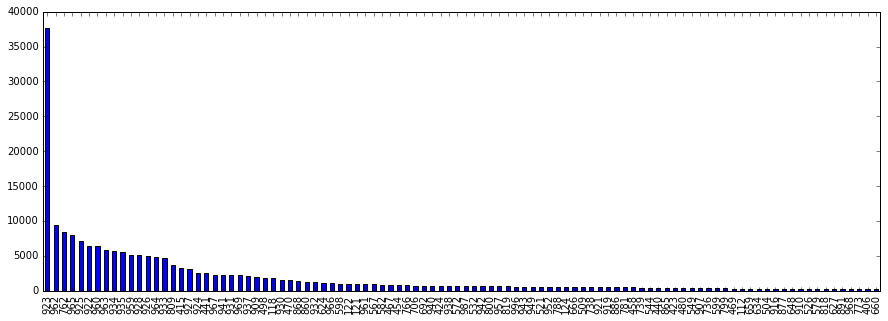

In [20]:
imagenet_label_counts[:100].plot(kind='bar', figsize=(15,5))

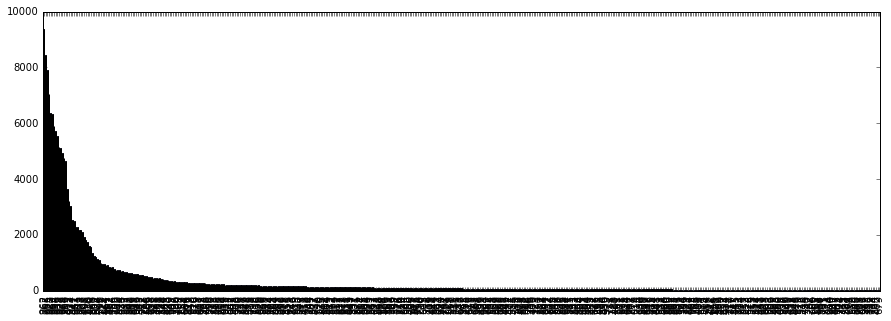

In [21]:
imagenet_label_counts[1:500].plot(kind='bar', figsize=(15,5))  # omit the label with the largest count

In [22]:
# how many labels occur only once in the training set?
sum(imagenet_label_counts == 1)

55

Define functions to plot photos on grid

In [24]:
def visualize_photos(photos_to_show, photo_label, num_images_on_axis = 5):
    """Visualize example photos in a grid, with predicted class as titles
    
    INPUT:
    photos_to_show - list of integer photo_ids (without absolute path or .jpg extension), ex: 337513
    photo_label - list (same length as photos_to_show) of strings, i.e. the predicted classes
    num_images_on_axis - integer, number photos on axis of square grid of photos
    """
    plt.rcParams['figure.figsize'] = (25.0, 25.0) # set default size of plots
    
    for x in range(num_images_on_axis ** 2):    
        plt.subplot(num_images_on_axis, num_images_on_axis, x+1)
        im = Image.open(data_root + 'train_photos/' + str(photos_to_show[x]) +'.jpg')
        plt.imshow(im)
        plt.axis('off')
        plt.title(photo_label[x])

In [46]:
def example_photos_to_plot(lower_cutoff, upper_cutoff, num_photos=25):
    """
    Randomly choose examples of photos whose predicted class occurs a certain number of times,
    specified by lower- and upper-cutoff, in the training set.
    
    Accesses outside of function 
    - imagenet_label_counts, series containing counts of class occurrences per label
    in the training set
    - train_probs, data frame with columns ImageNet_label, photo_id, top_class
    
    INPUT:
    lower_cutoff - integer, inclusive
    upper_cutoff - integer, inclusive
    num_photos - integer, number of examples to select
    
    RETURN:
    photos_to_show - list of integer photo_ids (without absolute path or .jpg extension), ex: 337513
    photo_label - list (same length as photos_to_show) of strings, i.e. the predicted classes
    """
    # (integer) labels that satisfy constraints on occurrence
    subset_labels = imagenet_label_counts[(imagenet_label_counts >= lower_cutoff) & 
                                          (imagenet_label_counts <= upper_cutoff)].index
    
    # rows (photos) whose top_class is in subset_labels
    subset_train_probs = train_probs[train_probs.top_class.isin(subset_labels)]
    
    # sample from the rows
    mask = np.random.choice(range(len(subset_train_probs.index)), size=num_photos, replace=False)
    photos_to_show = subset_train_probs.iloc[mask].photo_id.tolist()
    photo_label = subset_train_probs.iloc[mask].ImageNet_label.tolist()
    
    return photos_to_show, photo_label

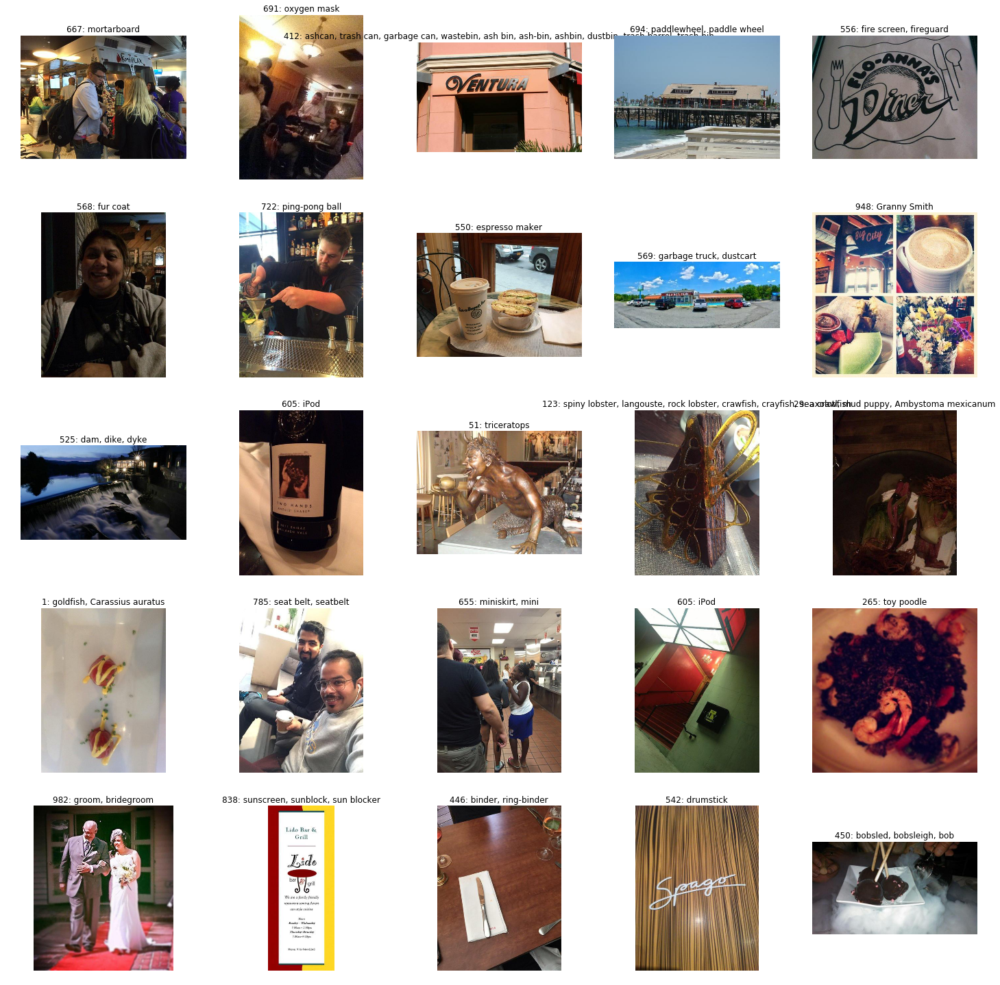

In [47]:
photos_to_show, photo_label = example_photos_to_plot(50,100, 25)
visualize_photos(photos_to_show, photo_label, 5)

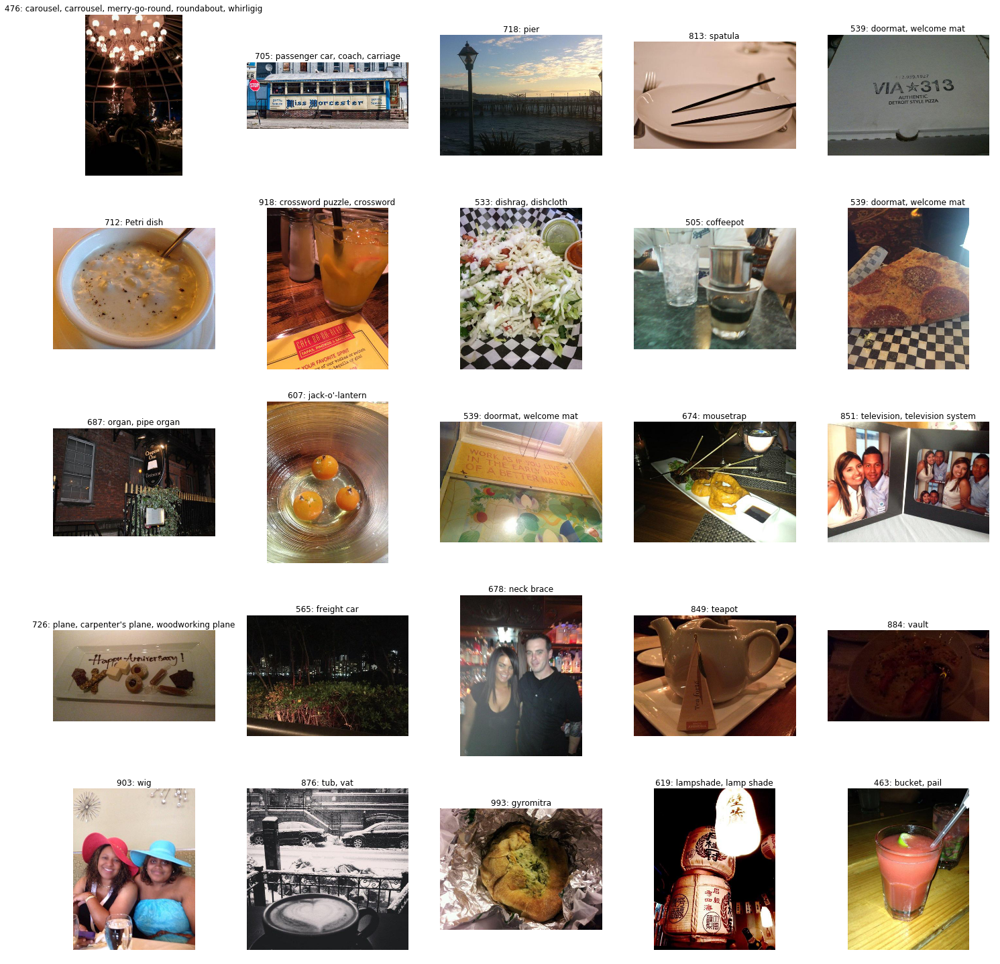

In [48]:
photos_to_show, photo_label = example_photos_to_plot(100,200, 25)
visualize_photos(photos_to_show, photo_label, 5)

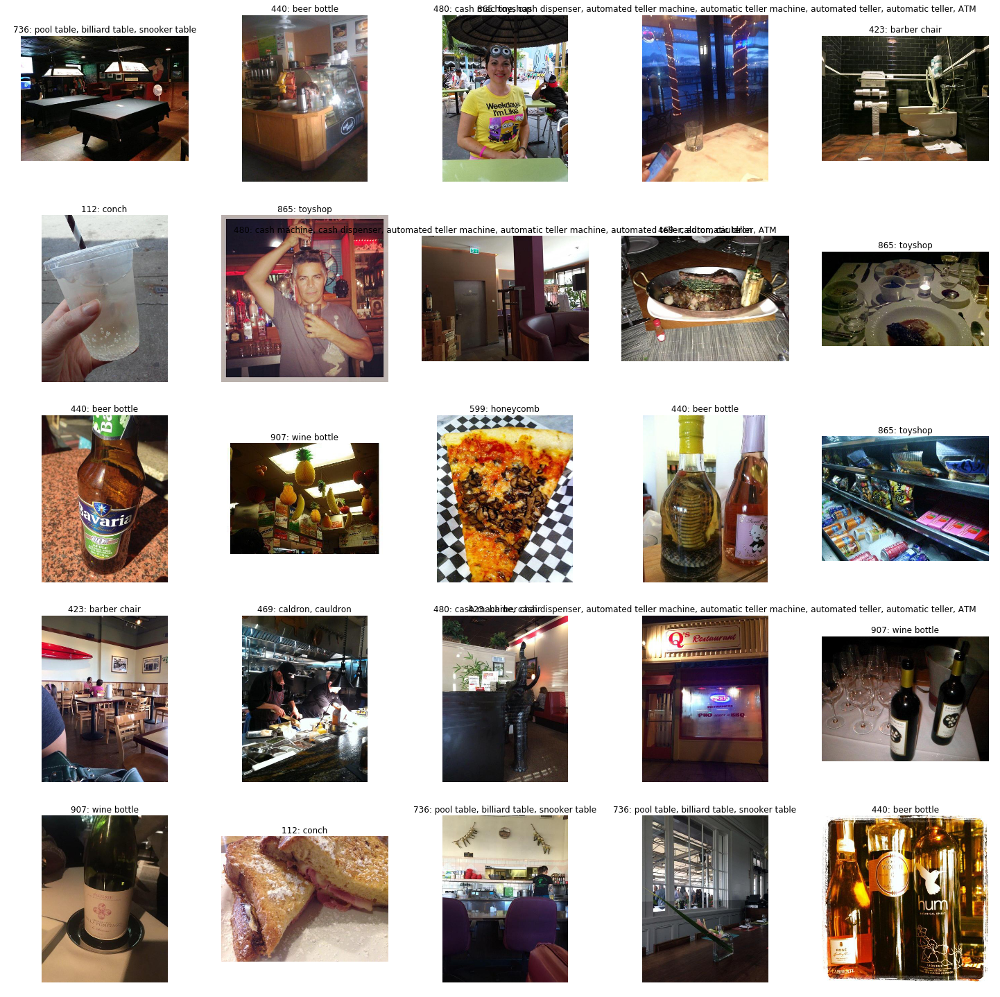

In [50]:
photos_to_show, photo_label = example_photos_to_plot(300,400, 25)
visualize_photos(photos_to_show, photo_label, 5)

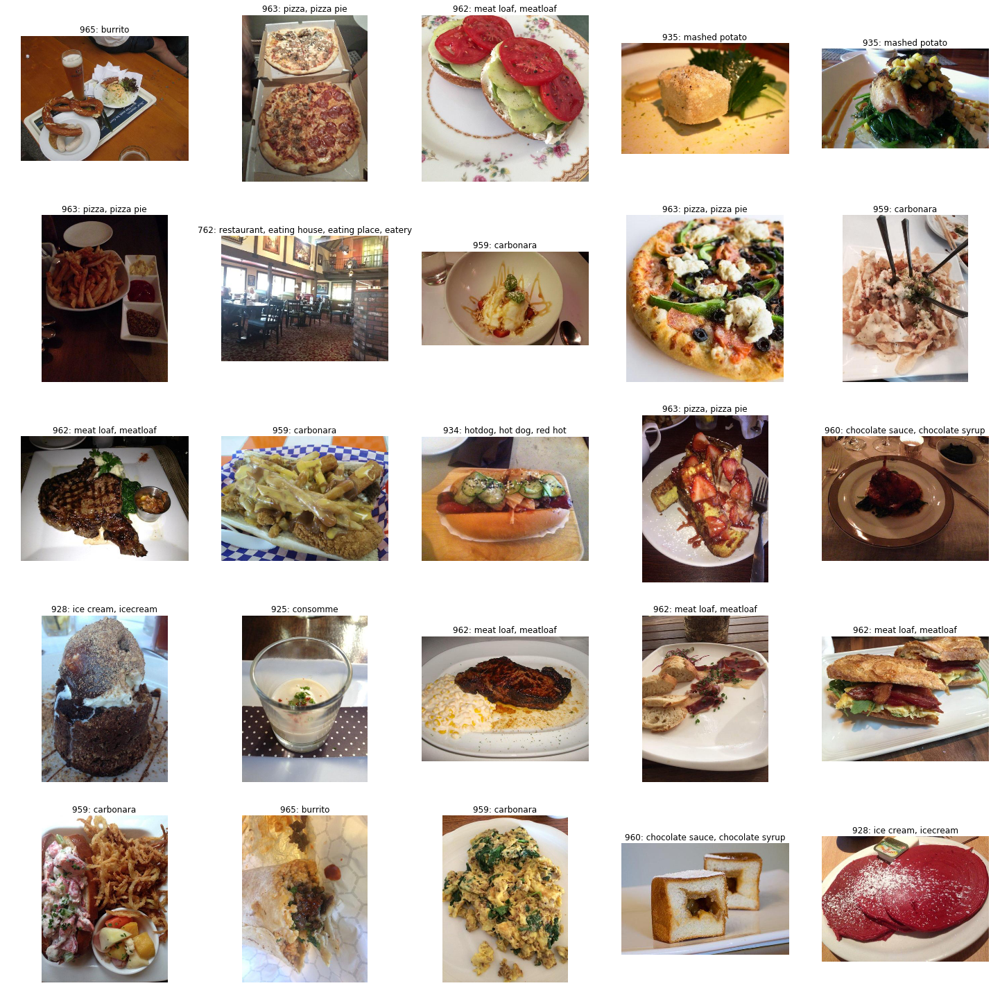

In [53]:
photos_to_show, photo_label = example_photos_to_plot(5000,10000, 25)
visualize_photos(photos_to_show, photo_label, 5)

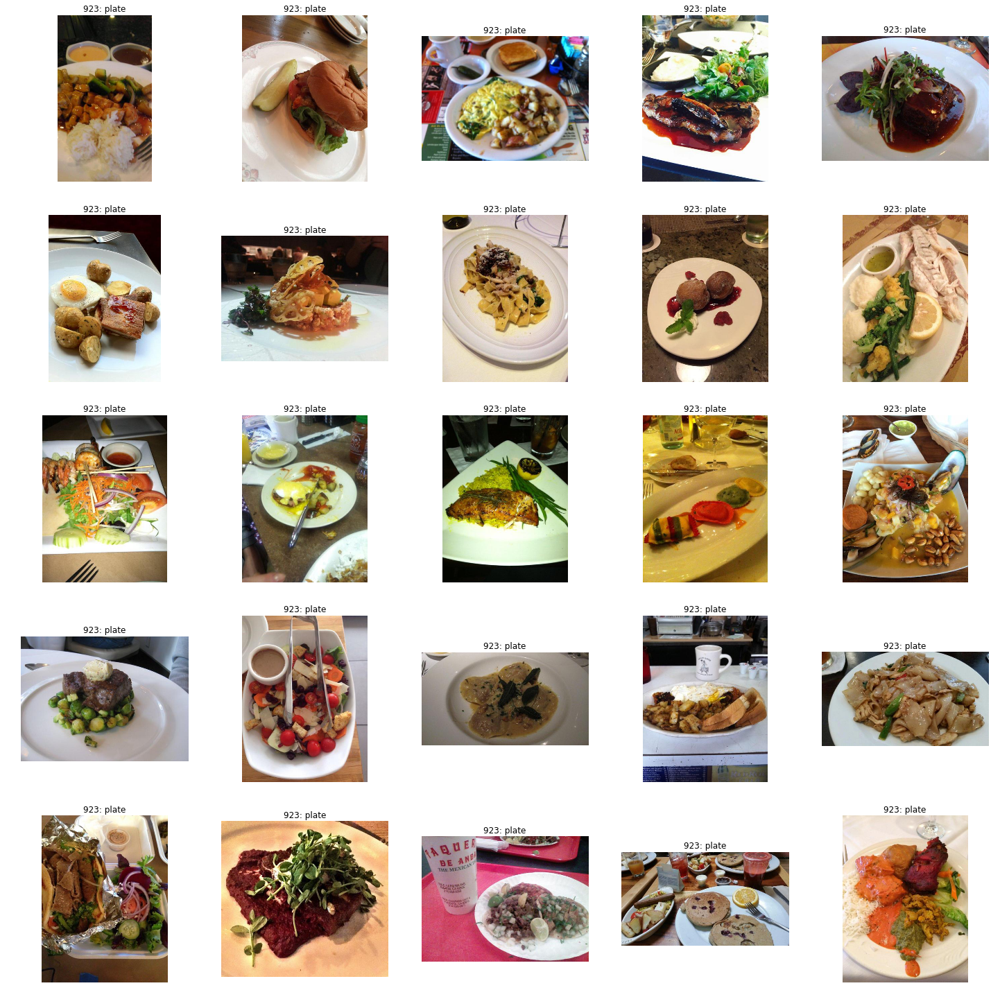

In [54]:
# visualize photos predicted to be "plate" (the only class that occurs > 30000 times in the training set)
photos_to_show, photo_label = example_photos_to_plot(30000,40000, 25)
visualize_photos(photos_to_show, photo_label, 5)

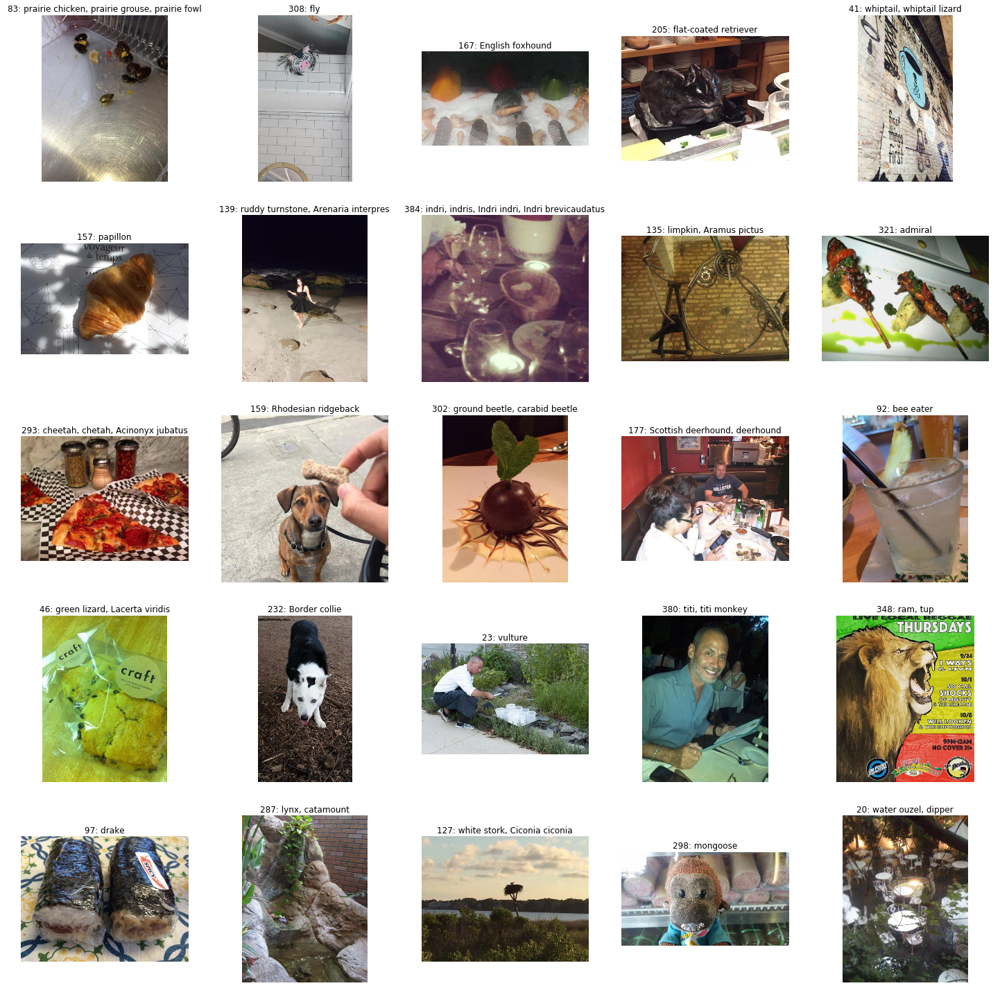

In [57]:
# photos tagged with classes that only occur once in the training set
photos_to_show, photo_label = example_photos_to_plot(1,1, 25)
visualize_photos(photos_to_show, photo_label, 5)

Clearly, there are a lot of misclassifications (although the net does well on specific dog breeds), so an aggregation approach like tf-idf of tokens (predicted classes of single photo instances) per document (restaurant) would not work well here.

However, predictions of the classes "907: wine bottle" and "440: beer bottle" (and possibly also "441: beer glass", "572: goblet", and "966: red wine") seem to be accurate and could be useful for predicting the Yelp attribute "5: has alcohol".

340 photos are labeled as class wine bottle
400 photos are labeled as class beer bottle
2498 photos are labeled as class beer glass
672 photos are labeled as class goblet
1088 photos are labeled as class red wine


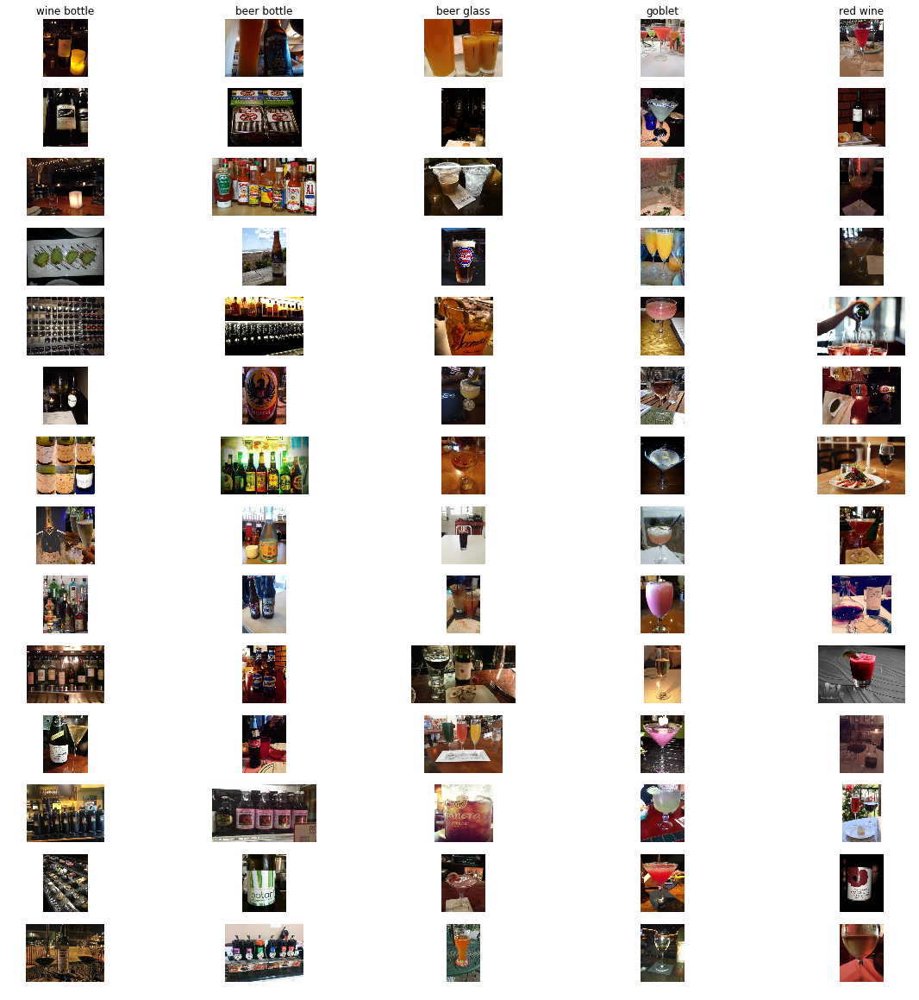

In [79]:
# plot some images predicted to be in classes related to alcohol
plt.rcParams['figure.figsize'] = (20.0, 20.0)

classes = [907, 440, 441, 572, 966]

num_classes = len(classes)
samples_per_class = 14

for y, cls in enumerate(classes):
    idxs = np.flatnonzero(train_probs.top_class == cls)
    
    print("{0} photos are labeled as class {1}".format(len(idxs), ImageNet_labels[cls]))
    
    idxs = np.random.choice(idxs, samples_per_class, replace=False)
    
    for i, idx in enumerate(idxs):
        plt_idx = i * num_classes + y + 1
        plt.subplot(samples_per_class, num_classes, plt_idx)
        im = Image.open(data_root + 'train_photos/' + str(train_probs.iloc[idx].photo_id) +'.jpg')
        plt.imshow(im)
        plt.axis('off')
        if i == 0:
            plt.title(ImageNet_labels[cls])

The neural net does a pretty good job identifying alcoholic drinks, so consider using the probabilities of these particular classes from the 1000-dim softmax vector for predicting the "5: has alcohol" attribute.

## Multi-instance problem
Take the average over the fc7 feature vectors, grouping by business_id, in order to obtain a single vector representation of each business.

In [5]:
# Load fc7 features for training set
photo_id, features_fc7 = load_photo_features('train_fc7_features.h5')

photo_id shape:  (234842,)
first few photo ids:  [204149  52779 278973]
features shape:  (234842, 4096)


In [6]:
# what is the number of zeros per row? (to get a sense of how sparse each 4096-dim vector is)
zeros_per_row = np.sum(features_fc7 == 0, axis=1)
zeros_per_row.shape

(234842,)

mean number of zeros per row is 3301.918843307415
median number of zeros per row is 3321.0


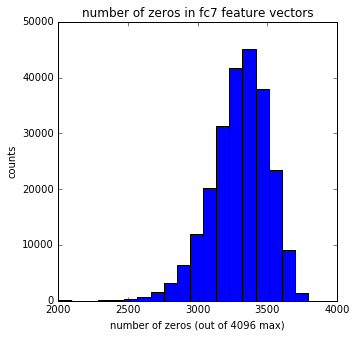

In [7]:
print("mean number of zeros per row is {0}".format(np.mean(zeros_per_row)))
print("median number of zeros per row is {0}".format(np.median(zeros_per_row)))

plt.rcParams['figure.figsize'] = (5.0, 5.0)
plt.hist(zeros_per_row, bins=20)
plt.xlabel("number of zeros (out of 4096 max)")
plt.ylabel("counts")
plt.title("number of zeros in fc7 feature vectors")

In [8]:
fc7_df = pd.DataFrame(features_fc7, index=photo_id)
fc7_df.head(4)

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
204149,0.00000,0.000000,0,0.000000,0.000000,0.104891,0.000000,0.000000,0,0,...,0.000000,0,0,0.821991,3.055485,0.000000,0,0,0.000000,0
52779,0.00000,0.000000,0,1.302624,0.943876,0.000000,0.977295,0.704183,0,0,...,3.308229,0,0,0.000000,0.000000,0.000000,0,0,1.589374,0
278973,1.15098,2.430013,0,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,...,1.672790,0,0,0.000000,0.000000,0.000000,0,0,0.000000,0
195284,0.00000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,...,0.000000,0,0,2.098176,0.000000,0.989935,0,0,0.000000,0


In [9]:
# join photo_ids to data frame mapping to business_id
fc7_business_df = pd.merge(train_photo_to_biz, fc7_df, left_on='photo_id', right_index=True, sort=False)
fc7_business_df.head(4)

MemoryError: 

## t-SNE (t-distributed Stochastic Neighbor Embedding) visualization

http://scikit-learn.org/stable/modules/manifold.html#t-distributed-stochastic-neighbor-embedding-t-sne

In [ ]:
from sklearn.decomposition import TruncatedSVD

X_reduced = TruncatedSVD(n_components=50, random_state=42).fit_transform(features_fc7)

In [ ]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2, perplexity=40, verbose=2).fit_transform(X_reduced)